<a href="https://colab.research.google.com/" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Synthetic CNV Image Classifier

이 노트북은 OCT2017 데이터셋의 CNV 이미지를 사용하여 Stable Diffusion 모델로 Synthetic CNV 이미지를 생성하고, 이를 Normal CNV 이미지와 다양한 비율(0%~100%)로 혼합하여 Classifier를 학습시킵니다. 목표는 Synthetic 이미지의 최적 비율을 찾아 Classifier 성능을 최대화하는 것입니다.

**실행 순서**:
1. 데이터 전처리: OCT2017 CNV/NORMAL 이미지 → ViT 임베딩 → `pre-trained_dataset.pt`.
2. Diffusion Model 파인튜닝: Stable Diffusion UNet을 CNV 이미지로 학습.
3. Synthetic CNV 이미지 생성: 파인튜닝된 모델로 이미지 생성 → ViT 임베딩 → `synthetic_cnv_dataset.pt`.
4. 비율별 Classifier 학습: Synthetic 비율 0%~100%로 데이터 혼합 → Classifier 학습 → 성능 비교.

**실행 환경**: Google Colab (GPU, 예: T4 또는 A100 권장).

## 1. 환경 설정 및 패키지 설치

필요한 Python 패키지를 설치하고, 랜덤 시드를 설정하여 재현성을 보장합니다. GPU를 사용하며, 메모리 관리를 위한 함수도 정의합니다.

In [1]:
!pip install kagglehub torch torchvision transformers diffusers accelerate datasets xformers pytorch-fid pandas
import os
import gc
import torch
import numpy as np
import random
from PIL import Image
import pandas as pd
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset, TensorDataset
from transformers import ViTModel, CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler, StableDiffusionPipeline
from accelerate import Accelerator
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
from pytorch_fid import fid_score

# 랜덤 시드 설정
seed = 123
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
random.seed(seed)

# GPU 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# 메모리 정리 함수
def clear_memory():
    gc.collect()
    torch.cuda.empty_cache()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.4/43.4 MB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## 2. 데이터 전처리: OCT2017 데이터셋 → ViT 임베딩

OCT2017 데이터셋의 CNV 및 NORMAL 이미지를 로드하고, ViT 모델을 사용하여 임베딩을 생성합니다. 결과는 `pre-trained_dataset.pt` 파일로 저장됩니다.

In [2]:
def img_transform():
    return transforms.Compose([
        transforms.Lambda(lambda img: img.crop((0, 100, 768, 400))),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def vit_process(img_list, batch_size=16):
    model_name = "google/vit-base-patch16-224"
    vit_model = ViTModel.from_pretrained(model_name, output_hidden_states=True).to(device)
    vit_model.eval()
    length = len(img_list)
    layers_0, layers_1, layers_2, layers_3 = [], [], [], []
    for i in range(int(length/batch_size)):
        batch_imgs = img_list[i*batch_size:(i+1)*batch_size]
        batch_tensor = torch.stack(batch_imgs, dim=0).to(device)
        with torch.no_grad():
            outputs = vit_model(pixel_values=batch_tensor)
        hidden = outputs.hidden_states
        last_layer = hidden[12][:,0,:]
        hidden_layer_1 = torch.zeros_like(last_layer)
        hidden_layer_2 = torch.zeros_like(last_layer)
        hidden_layer_3 = torch.zeros_like(last_layer)
        for j in range(12):
            if j < 4:
                hidden_layer_1 += hidden[j][:,0,:]/4
            elif j < 8:
                hidden_layer_2 += hidden[j][:,0,:]/4
            else:
                hidden_layer_3 += hidden[j][:,0,:]/4
        layers_0.append(last_layer)
        layers_1.append(hidden_layer_1)
        layers_2.append(hidden_layer_2)
        layers_3.append(hidden_layer_3)
        clear_memory()
    return (torch.cat(layers_0, dim=0), torch.cat(layers_1, dim=0),
            torch.cat(layers_2, dim=0), torch.cat(layers_3, dim=0))

def load_trans(path, pic_num=640):
    trans_toTensor = img_transform()
    image_list = []
    i = 0
    for filename in os.listdir(path):
        if i == pic_num:
            break
        file_path = os.path.join(path, filename)
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            try:
                img = Image.open(file_path).convert("RGB")
                tensor_img = trans_toTensor(img)
                image_list.append(tensor_img)
            except Exception as e:
                print(f"Skip: {filename}, Error: {e}")
        i += 1
    return image_list

def preprocess_data():
    print("Data Preprocessing: Start!")
    import kagglehub
    path = kagglehub.dataset_download("paultimothymooney/kermany2018")
    loadpath = os.path.join(path, "OCT2017 /train")
    train_path_cnv = os.path.join(loadpath, "CNV")
    train_path_normal = os.path.join(loadpath, "NORMAL")

    cnv_tensor_list = load_trans(train_path_cnv)
    normal_tensor_list = load_trans(train_path_normal)
    out_00, out_01, out_02, out_03 = vit_process(cnv_tensor_list)
    out_10, out_11, out_12, out_13 = vit_process(normal_tensor_list)

    batch_size, batch_num, half_batch = 128, 10, 64
    tensor_list_0, tensor_list_1, tensor_list_2, tensor_list_3, labels_list = [], [], [], [], []
    for i in range(batch_num):
        cnv_tensor_0 = out_00[i*half_batch:(i+1)*half_batch]
        norm_tensor_0 = out_10[i*half_batch:(i+1)*half_batch]
        cnv_tensor_1 = out_01[i*half_batch:(i+1)*half_batch]
        norm_tensor_1 = out_11[i*half_batch:(i+1)*half_batch]
        cnv_tensor_2 = out_02[i*half_batch:(i+1)*half_batch]
        norm_tensor_2 = out_12[i*half_batch:(i+1)*half_batch]
        cnv_tensor_3 = out_03[i*half_batch:(i+1)*half_batch]
        norm_tensor_3 = out_13[i*half_batch:(i+1)*half_batch]
        tensor_0 = torch.cat((cnv_tensor_0, norm_tensor_0), dim=0)
        tensor_1 = torch.cat((cnv_tensor_1, norm_tensor_1), dim=0)
        tensor_2 = torch.cat((cnv_tensor_2, norm_tensor_2), dim=0)
        tensor_3 = torch.cat((cnv_tensor_3, norm_tensor_3), dim=0)
        labels = torch.cat([torch.zeros(half_batch, dtype=torch.long), torch.ones(half_batch, dtype=torch.long)], dim=0)
        indices = torch.randperm(batch_size)
        tensor_list_0.append(tensor_0[indices])
        tensor_list_1.append(tensor_1[indices])
        tensor_list_2.append(tensor_2[indices])
        tensor_list_3.append(tensor_3[indices])
        labels_list.append(labels[indices])
    tensor_set_0 = torch.cat(tensor_list_0, dim=0)
    tensor_set_1 = torch.cat(tensor_list_1, dim=0)
    tensor_set_2 = torch.cat(tensor_list_2, dim=0)
    tensor_set_3 = torch.cat(tensor_list_3, dim=0)
    labels_set = torch.cat(labels_list, dim=0)

    if os.path.exists('pre-trained_dataset.pt'):
        os.remove('pre-trained_dataset.pt')
    torch.save({'data_0': tensor_set_0, 'data_1': tensor_set_1, 'data_2': tensor_set_2, 'data_3': tensor_set_3, 'label': labels_set}, 'pre-trained_dataset.pt')
    print('Data Preprocessing: Done!')

preprocess_data()
clear_memory()

Data Preprocessing: Start!


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Data Preprocessing: Done!


## 3. Diffusion Model 파인튜닝

Stable Diffusion 모델의 UNet을 CNV 이미지로 파인튜닝합니다. Kaggle 데이터셋을 다운로드하고, CNV 이미지를 전처리하여 학습에 사용합니다. 학습된 모델은 `/content/models/sd_cnv_finetuned`에 저장됩니다.

### 3.1 데이터 준비

Kaggle 데이터셋에서 CNV 이미지를 다운로드하고, 512x512 크기로 리사이징하여 `/content/processed/CNV/`에 저장합니다.

In [3]:
import kagglehub
import os
from PIL import Image

def prepare_cnv_images():
    # Kaggle 데이터셋 다운로드
    path = kagglehub.dataset_download("paultimothymooney/kermany2018")
    print(f"Dataset downloaded to: {path}")

    # 데이터셋 경로 설정 및 CNV 이미지 복사
    in_dir = os.path.join(path, "OCT2017 /train/CNV")
    out_dir = "/content/processed/CNV/"
    os.makedirs(out_dir, exist_ok=True)
    for fn in os.listdir(in_dir):
        img = Image.open(os.path.join(in_dir, fn)).convert("RGB")
        img = img.resize((512, 512), resample=Image.LANCZOS)
        img.save(os.path.join(out_dir, fn))
    print(f"Processed CNV images saved to {out_dir}")

prepare_cnv_images()

Dataset downloaded to: /kaggle/input/kermany2018
Processed CNV images saved to /content/processed/CNV/


### 3.2 데이터셋 클래스 정의

`ImgDataset` 클래스를 정의하여 CNV 이미지를 로드하고, 학습에 필요한 형식으로 변환합니다.

In [4]:
from torch.utils.data import Dataset
from torchvision import transforms

class ImgDataset(Dataset):
    def __init__(self, root_dir:str, tokenizer, cohort:str = "CNV", resolution=512, max_length=77, dataset_size:int = 6400) -> None:
        self.files = [
            os.path.join(root_dir, f)
            for f in os.listdir(root_dir)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]
        if len(self.files) > dataset_size: self.files = self.files[:dataset_size]
        self.tokenizer = tokenizer
        self.transform = transforms.Compose([
            transforms.Resize((resolution, resolution), transforms.InterpolationMode.LANCZOS),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ])
        self.prompt = f"OCT scan showing {cohort}"
        self.max_length = max_length

    def __len__(self) -> int:
        return len(self.files)

    def __getitem__(self, idx:int) -> dict:
        img = Image.open(self.files[idx]).convert("RGB")
        img = self.transform(img)
        tokens = self.tokenizer(
            self.prompt,
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )
        return {"pixel_values": img, "input_ids": tokens.input_ids.squeeze(0)}

### 3.3 학습 함수 정의

`train` 함수를 정의하여 Stable Diffusion UNet을 CNV 이미지로 파인튜닝합니다. 혼합 정밀도 학습과 체크포인트 저장을 지원합니다.

In [5]:
import torch
from torch.utils.data import DataLoader
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
from accelerate import Accelerator

def train(
    pretrained_model: str,
    data_dir: str,
    output_dir: str = "sd_cnv_finetuned",
    cohort: str = "CNV",
    resolution: int = 512,
    dataset_size: int = 6400,
    batch_size: int = 4,
    learning_rate: float = 1e-4,
    epochs: int = 5,
    grad_accum_steps: int = 1,
    save_steps: int = 1000,
    resume_checkpoint: str = None,
    unet: UNet2DConditionModel = None,
    accelerator: Accelerator = None,
):
    # 1) Prepare output directory, accelerator & device
    os.makedirs(output_dir, exist_ok=True)
    accel = accelerator or Accelerator()
    device = accel.device

    # 2) Load or resume UNet
    if resume_checkpoint and unet is None:
        unet = UNet2DConditionModel.from_pretrained(resume_checkpoint).to(device)
    elif unet is None:
        unet = UNet2DConditionModel.from_pretrained(pretrained_model, subfolder="unet").to(device)

    # 3) Load & freeze tokenizer + text encoder
    tokenizer = CLIPTokenizer.from_pretrained(pretrained_model, subfolder="tokenizer")
    text_encoder = CLIPTextModel.from_pretrained(pretrained_model, subfolder="text_encoder").to(device)
    text_encoder.requires_grad_(False)

    # 4) Load & freeze VAE
    vae = AutoencoderKL.from_pretrained(pretrained_model, subfolder="vae").to(device)
    vae.requires_grad_(False)

    # 5) Load noise scheduler
    scheduler = DDPMScheduler.from_pretrained(pretrained_model, subfolder="scheduler")

    # 6) Prepare dataset & dataloader
    dataset = ImgDataset(data_dir, tokenizer, cohort=cohort, resolution=resolution, dataset_size=dataset_size)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # 7) Optimizer (only UNet params)
    optimizer = torch.optim.AdamW(unet.parameters(), lr=learning_rate)

    # 8) Wrap models, optimizer, and dataloader for mixed-precision / distributed
    unet, optimizer, dataloader = accel.prepare(unet, optimizer, dataloader)

    # 9) Resume state if requested
    if resume_checkpoint:
        accel.load_state(resume_checkpoint)
        global_step = int(resume_checkpoint.rsplit("_", 1)[-1])
    else:
        global_step = 0

    # 10) Training loop
    for epoch in range(1, epochs + 1):
        unet.train()
        for batch in dataloader:
            with accel.accumulate(unet):
                # Encode images to latents
                pixels = batch["pixel_values"].to(device)
                latents = vae.encode(pixels).latent_dist.sample() * 0.18215

                # Add noise
                noise = torch.randn_like(latents)
                timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (latents.shape[0],), device=device)
                noisy_latents = scheduler.add_noise(latents, noise, timesteps)

                # Text conditioning
                input_ids = batch["input_ids"].to(device)
                encoder_hidden_states = text_encoder(input_ids)[0]

                # Noise prediction & loss
                pred_noise = unet(noisy_latents, timesteps, encoder_hidden_states).sample
                loss = torch.nn.functional.mse_loss(pred_noise, noise)

                # Backpropagate
                accel.backward(loss)
                optimizer.step()
                optimizer.zero_grad()

            global_step += 1
            if global_step % save_steps == 0:
                accel.wait_for_everyone()
                ckpt_dir = os.path.join(output_dir, f"checkpoint_{global_step}")
                unet.save_pretrained(ckpt_dir)
                if accel.is_main_process:
                    tokenizer.save_pretrained(ckpt_dir)
                accel.save_state(ckpt_dir)

        print(f"Epoch {epoch}/{epochs} complete")

    # 11) Final save
    accel.wait_for_everyone()
    final_dir = os.path.join(output_dir, "final_unet")
    unet.save_pretrained(final_dir)
    if accel.is_main_process:
        tokenizer.save_pretrained(output_dir)
    print("Fine-tuning complete — models saved to", output_dir)

### 3.4 Diffusion Model 학습 실행

미리 학습된 모델(`nota-ai/bk-sdm-small`)을 사용하여 CNV 이미지로 파인튜닝을 실행합니다.

In [6]:
from accelerate import Accelerator

# Accelerator 초기화
accel = Accelerator()

# Diffusion Model 학습 실행
train(
    pretrained_model="nota-ai/bk-sdm-small",
    data_dir="/content/processed/CNV",
    output_dir="/content/models/sd_cnv_finetuned",
    cohort="CNV",
    resolution=512,
    dataset_size=500,  # 학습 시간 고려
    batch_size=4,
    learning_rate=1e-4,
    epochs=10,
    grad_accum_steps=1,
    save_steps=1000,
    resume_checkpoint=None,
    accelerator=accel
)

# 메모리 정리
clear_memory()

config.json:   0%|          | 0.00/1.51k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.93G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

Epoch 1/10 complete
Epoch 2/10 complete
Epoch 3/10 complete
Epoch 4/10 complete
Epoch 5/10 complete
Epoch 6/10 complete
Epoch 7/10 complete
Epoch 8/10 complete
Epoch 9/10 complete
Epoch 10/10 complete
Fine-tuning complete — models saved to /content/models/sd_cnv_finetuned


## 4. Synthetic CNV 이미지 생성

파인튜닝된 Diffusion Model을 사용하여 Synthetic CNV 이미지를 생성하고, ViT 임베딩을 생성하여 `synthetic_cnv_dataset.pt`로 저장합니다.

In [8]:
# 셀 10: Synthetic CNV 이미지 생성
def generate_synthetic_images():
    # 원본 모델에서 기본 파이프라인 로드
    pipeline = StableDiffusionPipeline.from_pretrained(
        "nota-ai/bk-sdm-small",
        torch_dtype=torch.float16,
        use_auth_token=False
    ).to(device)

    # 파인튜닝된 UNet 로드
    unet = UNet2DConditionModel.from_pretrained(
        "/content/models/sd_cnv_finetuned/final_unet",
        torch_dtype=torch.float16
    ).to(device)

    # 파이프라인의 UNet 교체
    pipeline.unet = unet

    # Synthetic 이미지 생성
    synthetic_dir = "/content/synthetic_cnv/"
    os.makedirs(synthetic_dir, exist_ok=True)
    num_images = 640
    prompt = "OCT scan showing CNV"

    for i in range(num_images):
        image = pipeline(prompt, num_inference_steps=50).images[0]
        image.save(os.path.join(synthetic_dir, f"synthetic_cnv_{i}.png"))
        if i % 50 == 0:
            print(f"Generated {i}/{num_images} images")
        clear_memory()

    # Synthetic 이미지 ViT 임베딩 생성
    synthetic_tensor_list = load_trans(synthetic_dir, pic_num=num_images)
    out_00, out_01, out_02, out_03 = vit_process(synthetic_tensor_list)

    # synthetic_cnv_dataset.pt 저장
    if os.path.exists('synthetic_cnv_dataset.pt'):
        os.remove('synthetic_cnv_dataset.pt')
    torch.save({
        'data_0': out_00,
        'data_1': out_01,
        'data_2': out_02,
        'data_3': out_03,
        'label': torch.zeros(num_images, dtype=torch.long)
    }, 'synthetic_cnv_dataset.pt')
    print("Synthetic CNV dataset saved to synthetic_cnv_dataset.pt")

generate_synthetic_images()
clear_memory()

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

Keyword arguments {'use_auth_token': False} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generated 0/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generated 50/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 100/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 150/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generated 200/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generated 250/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 300/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 350/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Generated 400/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generated 450/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 500/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generated 550/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 600/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Synthetic CNV dataset saved to synthetic_cnv_dataset.pt


## 5. Classifier 모델 정의

ViT 임베딩을 입력으로 받아 CNV와 NORMAL을 분류하는 Classifier 모델을 정의합니다.

In [16]:
import torch.nn as nn
import torch.nn.init as init
import abc

class TransformerBlock(nn.Module):
    def __init__(self, input_size, head_num=10):
        super(TransformerBlock, self).__init__()
        self.input_size = input_size
        self.head_num = head_num
        self.query = nn.Linear(input_size, input_size)
        self.key = nn.Linear(input_size, input_size)
        self.value = nn.Linear(input_size, input_size)
        self.multihead = nn.MultiheadAttention(input_size, head_num)
        self.dropout = nn.Dropout(0.3)
        self.norm = nn.LayerNorm(input_size)
        self.linear = nn.Linear(input_size, input_size)

    def forward(self, q, k, v):
        q = self.query(q)
        k = self.key(k)
        v = self.value(v)
        attn_output, _ = self.multihead(q, k, v)
        attn_output = self.dropout(attn_output)
        output = self.norm(attn_output + q)
        output = self.linear(output)
        output = self.dropout(output)
        output = self.norm(output + attn_output)
        return output

class EncoderBlock(nn.Module):
    def __init__(self, input_dim=768, hidden_dim_1=900, hidden_dim_2=450, attn_drop=0.15):
        super(EncoderBlock, self).__init__()
        self.attn_drop = attn_drop
        dataset_dic = torch.load('pre-trained_dataset.pt')
        embedding_weights_0 = dataset_dic['data_0']
        embedding_weights_1 = dataset_dic['data_1']
        embedding_weights_2 = dataset_dic['data_2']
        embedding_weights_3 = dataset_dic['data_3']
        total = 1280
        self.embedding_layer_0 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_0)
        self.embedding_layer_1 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_1)
        self.embedding_layer_2 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_2)
        self.embedding_layer_3 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_3)
        self.linear_1 = nn.Linear(input_dim, hidden_dim_1)
        self.linear_2 = nn.Linear(hidden_dim_1, hidden_dim_2)
        self.linear_3 = nn.Linear(hidden_dim_2, hidden_dim_1)
        self.dropout = nn.Dropout(attn_drop)
        self.relu = nn.ReLU()
        self.norm = nn.LayerNorm(hidden_dim_1)  # 잔차 연결 안정화를 위해 추가
        self.__init_weights__()

    def __init_weights__(self):
        init.xavier_normal_(self.linear_1.weight)
        init.xavier_normal_(self.linear_2.weight)
        init.xavier_normal_(self.linear_3.weight)

    def forward(self, layer_id=0, X_id=0):
        if torch.is_tensor(X_id):
            X_id = X_id.to(device)
            if layer_id == 0:
                X_ = self.embedding_layer_0(X_id).to(torch.float32)
            elif layer_id == 1:
                X_ = self.embedding_layer_1(X_id).to(torch.float32)
            elif layer_id == 2:
                X_ = self.embedding_layer_2(X_id).to(torch.float32)
            elif layer_id == 3:
                X_ = self.embedding_layer_3(X_id).to(torch.float32)
        else:
            print("Non-standard use of encoderblock!")
        residual = self.relu(self.linear_1(X_))
        x_ = self.relu(self.dropout(self.linear_2(residual)))
        x_ = self.linear_3(x_)
        x_ = self.norm(x_ + residual)  # LayerNorm 추가
        return x_

class NeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.best_acc = 0
        self.init_clip_max_norm = None

    @abc.abstractmethod
    def forward(self):
        pass

    def fit(self, x_train, y_train, x_val, y_val, x_test, y_test):
        if torch.cuda.is_available():
            self.cuda()
        self.optimizer = torch.optim.Adam(self.parameters(), lr=8e-5, weight_decay=1e-5)  # weight_decay 추가
        dataset = TensorDataset(x_train, y_train)
        dataloader = DataLoader(dataset, batch_size=64, shuffle=True)  # 배치 크기 감소
        loss = nn.CrossEntropyLoss()
        epochs = 15
        for epoch in range(epochs):
            print(f"\nEpoch {epoch + 1}/{epochs}")
            self.train()
            for i, data in enumerate(dataloader):
                total = len(dataloader)
                batch_x_id, batch_y = (item.cuda() for item in data)
                self.batch_dealer(batch_x_id, batch_y, loss, i, epoch+1, total)
            self.batch_evaluate(x_val, y_val)

    def batch_dealer(self, x_id, y, loss, i, epoch, total):
        self.optimizer.zero_grad()
        logit_original = self.forward(x_id, epoch=epoch)
        loss_classify = loss(logit_original, y)
        loss_classify.backward()
        self.optimizer.step()
        corrects = (torch.max(logit_original, 1)[1].view(y.size()).data == y.data).sum()
        accuracy = 100 * corrects / len(y)
        print(f'Batch[{i + 1}/{total}] - loss: {loss_classify.item():.6f}  accuracy: {accuracy:.4f}%({corrects}/{y.size(0)})')

    def batch_evaluate(self, x, y):
        y_pred = self.predicter(x)
        acc = accuracy_score(y, y_pred)
        if acc > self.best_acc:
            self.best_acc = acc
        # 클래스 분포 디버깅
        print("y_true classes:", np.unique(y))
        print("y_pred classes:", np.unique(y_pred))
        # classification_report에 labels 명시
        try:
            print(classification_report(y, y_pred, labels=[0, 1], target_names=['NR', 'FR'], digits=5))
        except ValueError as e:
            print(f"Error in classification_report: {e}")
            print("Skipping classification report due to single class prediction")
        print("Val set acc:", acc)
        print("Best val set acc:", self.best_acc)

    def predicter(self, x):
        if torch.cuda.is_available():
            self.cuda()
        self.eval()
        y_pred = []
        dataset = TensorDataset(x)
        dataloader = DataLoader(dataset, batch_size=16)
        for i, data in enumerate(dataloader):
            with torch.no_grad():
                batch_x_id = data[0].cuda()
                logits = self.forward(batch_x_id)
                predicted = torch.max(logits, dim=1)[1]
                y_pred += predicted.data.cpu().numpy().tolist()
        return y_pred

class Classifier(NeuralNetwork):
    def __init__(self):
        super().__init__()
        self.encoder_block = EncoderBlock()
        self.attention = TransformerBlock(input_size=300)
        self.dropout = nn.Dropout(0.6)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(3600, 300)
        self.fc1 = nn.Linear(300, 600)
        self.fc2 = nn.Linear(600, 300)
        self.fc3 = nn.Linear(in_features=300, out_features=2)
        self.init_weight()

    def init_weight(self):
        init.xavier_normal_(self.fc.weight)
        init.xavier_normal_(self.fc1.weight)
        init.xavier_normal_(self.fc2.weight)
        init.xavier_normal_(self.fc3.weight)

    def forward(self, x_id, epoch=0):
        batch_size = x_id.shape[0]
        x_id = x_id.cuda()
        embedding_0 = self.encoder_block(layer_id=0, X_id=x_id)
        embedding_1 = self.encoder_block(layer_id=1, X_id=x_id)
        embedding_2 = self.encoder_block(layer_id=2, X_id=x_id)
        embedding_3 = self.encoder_block(layer_id=3, X_id=x_id)
        embedding = torch.cat((embedding_0, embedding_1, embedding_2, embedding_3), dim=1)
        embedding = self.relu(self.fc(embedding))
        enhanced = self.attention(embedding.view(batch_size, 1, 300), embedding.view(batch_size, 1, 300), embedding.view(batch_size, 1, 300))
        enhanced = enhanced.squeeze(1)
        a1 = self.relu(self.dropout(self.fc1(enhanced)))
        a1 = self.relu(self.dropout(self.fc2(a1)))
        output = self.fc3(a1)
        return output

def train_and_test(model, x_train, y_train, x_val, y_val, x_test, y_test):
    nn = model
    nn.fit(x_train, y_train, x_val, y_val, x_test, y_test)
    y_pred = nn.predicter(x_test)
    print("Test y_true classes:", np.unique(y_test))
    print("Test y_pred classes:", np.unique(y_pred))
    try:
        res = classification_report(y_test, y_pred, labels=[0, 1], target_names=['NR', 'FR'], digits=3, output_dict=True)
        for k, v in res.items():
            print(k, v)
        print(f"result: {res['accuracy']:.4f}")
    except ValueError as e:
        print(f"Error in classification_report: {e}")
        res = {'accuracy': 0, 'macro avg': {'f1-score': 0, 'precision': 0, 'recall': 0}}
    return res

## 6. 비율별 Classifier 학습 및 결과 분석

Synthetic CNV 이미지와 Normal CNV 이미지를 0%에서 100%까지 다양한 비율로 혼합하여 Classifier를 학습시키고, 성능을 비교합니다. 결과는 `classifier_results.csv`에 저장됩니다.

In [23]:
def train_classifier_with_ratios():
    normal_dataset = torch.load('pre-trained_dataset.pt')
    synthetic_dataset = torch.load('synthetic_cnv_dataset.pt')

    normal_cnv_indices = normal_dataset['label'] == 0
    normal_normal_indices = normal_dataset['label'] == 1
    normal_cnv_data = {
        'data_0': normal_dataset['data_0'][normal_cnv_indices],
        'data_1': normal_dataset['data_1'][normal_cnv_indices],
        'data_2': normal_dataset['data_2'][normal_cnv_indices],
        'data_3': normal_dataset['data_3'][normal_cnv_indices],
        'label': normal_dataset['label'][normal_cnv_indices]
    }
    normal_normal_data = {
        'data_0': normal_dataset['data_0'][normal_normal_indices],
        'data_1': normal_dataset['data_1'][normal_normal_indices],
        'data_2': normal_dataset['data_2'][normal_normal_indices],
        'data_3': normal_dataset['data_3'][normal_normal_indices],
        'label': normal_dataset['label'][normal_normal_indices]
    }
    synthetic_cnv_data = synthetic_dataset

    ratios = np.arange(0, 1.1, 0.1)
    results = []

    for ratio in ratios:
        print(f"\nTraining with Synthetic Ratio: {ratio*100:.0f}%")
        num_synthetic = int(640 * ratio)
        num_normal_cnv = 640 - num_synthetic
        indices_synthetic = np.random.choice(640, num_synthetic, replace=False)
        indices_normal_cnv = np.random.choice(640, num_normal_cnv, replace=False)

        mixed_data_0 = torch.cat([
            synthetic_cnv_data['data_0'][indices_synthetic],
            normal_cnv_data['data_0'][indices_normal_cnv],
            normal_normal_data['data_0']
        ], dim=0)
        mixed_data_1 = torch.cat([
            synthetic_cnv_data['data_1'][indices_synthetic],
            normal_cnv_data['data_1'][indices_normal_cnv],
            normal_normal_data['data_1']
        ], dim=0)
        mixed_data_2 = torch.cat([
            synthetic_cnv_data['data_2'][indices_synthetic],
            normal_cnv_data['data_2'][indices_normal_cnv],
            normal_normal_data['data_2']
        ], dim=0)
        mixed_data_3 = torch.cat([
            synthetic_cnv_data['data_3'][indices_synthetic],
            normal_cnv_data['data_3'][indices_normal_cnv],
            normal_normal_data['data_3']
        ], dim=0)
        mixed_labels = torch.cat([
            synthetic_cnv_data['label'][indices_synthetic],
            normal_cnv_data['label'][indices_normal_cnv],
            normal_normal_data['label']
        ], dim=0)

        x_train = torch.arange(0, 1024)
        x_val = torch.arange(1024, 1152)
        x_test = torch.arange(1152, 1280)
        y_train = mixed_labels[:1024]
        y_val = mixed_labels[1024:1152]
        y_test = mixed_labels[1152:1280]

        # 임베딩 저장
        if os.path.exists('pre-trained_dataset.pt'):
            os.remove('pre-trained_dataset.pt')
        torch.save({
            'data_0': mixed_data_0,
            'data_1': mixed_data_1,
            'data_2': mixed_data_2,
            'data_3': mixed_data_3,
            'label': mixed_labels
        }, 'pre-trained_dataset.pt')

        model = Classifier()
        res = train_and_test(model, x_train, y_train, x_val, y_val, x_test, y_test)

        results.append({
            'ratio': ratio,
            'accuracy': res['accuracy'],
            'f1_score': res['macro avg']['f1-score'],
            'precision': res['macro avg']['precision'],
            'recall': res['macro avg']['recall']
        })
        clear_memory()

    print("\nResults Summary:")
    for res in results:
        print(f"Ratio: {res['ratio']*100:.0f}% | Accuracy: {res['accuracy']:.4f} | F1 Score: {res['f1_score']:.4f} | Precision: {res['precision']:.4f} | Recall: {res['recall']:.4f}")

    best_result = max(results, key=lambda x: x['accuracy'])
    print(f"\nBest Ratio: {best_result['ratio']*100:.0f}%")
    print(f"Accuracy: {best_result['accuracy']:.4f}")
    print(f"F1 Score: {best_result['f1_score']:.4f}")
    print(f"Precision: {best_result['precision']:.4f}")
    print(f"Recall: {best_result['recall']:.4f}")

    pd.DataFrame(results).to_csv('classifier_results.csv', index=False)
    print("Results saved to classifier_results.csv")

train_classifier_with_ratios()


Training with Synthetic Ratio: 0%

Epoch 1/15
Batch[1/16] - loss: 1.043964  accuracy: 53.1250%(34/64)
Batch[2/16] - loss: 0.943133  accuracy: 50.0000%(32/64)
Batch[3/16] - loss: 1.115324  accuracy: 48.4375%(31/64)
Batch[4/16] - loss: 0.908429  accuracy: 51.5625%(33/64)
Batch[5/16] - loss: 0.855365  accuracy: 64.0625%(41/64)
Batch[6/16] - loss: 0.710964  accuracy: 67.1875%(43/64)
Batch[7/16] - loss: 0.903380  accuracy: 64.0625%(41/64)
Batch[8/16] - loss: 0.600856  accuracy: 73.4375%(47/64)
Batch[9/16] - loss: 0.431179  accuracy: 82.8125%(53/64)
Batch[10/16] - loss: 0.591085  accuracy: 75.0000%(48/64)
Batch[11/16] - loss: 0.462125  accuracy: 71.8750%(46/64)
Batch[12/16] - loss: 0.440440  accuracy: 79.6875%(51/64)
Batch[13/16] - loss: 0.553741  accuracy: 73.4375%(47/64)
Batch[14/16] - loss: 0.423060  accuracy: 81.2500%(52/64)
Batch[15/16] - loss: 0.389225  accuracy: 84.3750%(54/64)
Batch[16/16] - loss: 0.419567  accuracy: 78.1250%(50/64)
y_true classes: [1]
y_pred classes: [1]
          

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[12/16] - loss: 0.047337  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.072705  accuracy: 96.8750%(62/64)
Batch[14/16] - loss: 0.026763  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.040180  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.030126  accuracy: 98.4375%(63/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.022763  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.026105  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.018017  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.038307  accuracy: 98.4375%(63/64)
Batch[5/16] - loss: 0.017385  accuracy: 100.0000%(64/64)
Batch[6/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.003788  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.005166  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.023884  accuracy: 98.4375%(63/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.002941  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.012017  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.008315  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001759  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.006992  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.004190  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002166  accuracy: 100.0000%(64/64)
Batch[8/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[16/16] - loss: 0.007748  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 6/15
Batch[1/16] - loss: 0.003358  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.003235  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.002756  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.004009  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003364  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.002024  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000988  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.001902  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.006776  accuracy: 100.0000%(64/64)
Batch[10/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 8/15
Batch[1/16] - loss: 0.006377  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.006953  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000560  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001957  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003056  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001672  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002163  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000788  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003657  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001067  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001770  accuracy: 100.0000%(

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[4/16] - loss: 0.001046  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003629  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001774  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002261  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.001508  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001804  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000465  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001487  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001037  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000982  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001848  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000762  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001018  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000     

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[8/16] - loss: 0.002836  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000607  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000883  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.002206  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000953  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000445  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001430  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000952  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.002381  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.002495  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[11/16] - loss: 0.004834  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001266  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000425  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000333  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000656  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000254  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.000923  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001143  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000670  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000236  accuracy: 100.0000%(64/64)
Batch

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 10%

Epoch 1/15
Batch[1/16] - loss: 0.999101  accuracy: 50.0000%(32/64)
Batch[2/16] - loss: 0.958494  accuracy: 57.8125%(37/64)
Batch[3/16] - loss: 1.077408  accuracy: 54.6875%(35/64)
Batch[4/16] - loss: 1.011612  accuracy: 56.2500%(36/64)
Batch[5/16] - loss: 1.041363  accuracy: 53.1250%(34/64)
Batch[6/16] - loss: 0.961143  accuracy: 60.9375%(39/64)
Batch[7/16] - loss: 0.699024  accuracy: 70.3125%(45/64)
Batch[8/16] - loss: 0.699244  accuracy: 65.6250%(42/64)
Batch[9/16] - loss: 0.585897  accuracy: 64.0625%(41/64)
Batch[10/16] - loss: 0.539551  accuracy: 78.1250%(50/64)
Batch[11/16] - loss: 0.558047  accuracy: 70.3125%(45/64)
Batch[12/16] - loss: 0.565282  accuracy: 75.0000%(48/64)
Batch[13/16] - loss: 0.494302  accuracy: 75.0000%(48/64)
Batch[14/16] - loss: 0.468307  accuracy: 78.1250%(50/64)
Batch[15/16] - loss: 0.453242  accuracy: 81.2500%(52/64)
Batch[16/16] - loss: 0.381959  accuracy: 82.8125%(53/64)
y_true classes: [1]
y_pred classes: [1]
         

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[12/16] - loss: 0.100867  accuracy: 96.8750%(62/64)
Batch[13/16] - loss: 0.056711  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.040553  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.064608  accuracy: 98.4375%(63/64)
Batch[16/16] - loss: 0.036021  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.040196  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.039941  accuracy: 98.4375%(63/64)
Batch[3/16] - loss: 0.016097  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.025921  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.021487  accuracy: 100.0000%(64/64)
Batch[6/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[16/16] - loss: 0.003739  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.007165  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001251  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.005901  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001172  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003012  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.017506  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.006636  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.005473  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002640  accuracy: 100.0000%(64/64)
Batch[10/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.001894  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.006988  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.002425  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.003272  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.002176  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.004910  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001766  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003261  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001003  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001044  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001762  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001704  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000821  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.002342  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.002536  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000738  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[3/16] - loss: 0.003566  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.002771  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003733  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000797  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.005677  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003935  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003741  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000780  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000650  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001767  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.003349  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001343  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000937  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001168  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[7/16] - loss: 0.001239  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000890  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002290  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.023581  accuracy: 98.4375%(63/64)
Batch[11/16] - loss: 0.000996  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000812  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002244  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.003856  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000809  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.002631  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 11/15
Batch

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[11/16] - loss: 0.001755  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001355  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002251  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000852  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000459  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001108  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.001949  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000420  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001317  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000425  accuracy: 100.0000%(64/64)
Batch

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[15/16] - loss: 0.000672  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.003037  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.002399  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001867  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000330  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001168  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.002228  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000189  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000432  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000719  accuracy: 100.0000%(64/64)
Batch[9/1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 20%

Epoch 1/15
Batch[1/16] - loss: 1.196227  accuracy: 57.8125%(37/64)
Batch[2/16] - loss: 1.065879  accuracy: 51.5625%(33/64)
Batch[3/16] - loss: 0.990418  accuracy: 53.1250%(34/64)
Batch[4/16] - loss: 1.105607  accuracy: 50.0000%(32/64)
Batch[5/16] - loss: 0.939610  accuracy: 56.2500%(36/64)
Batch[6/16] - loss: 0.849038  accuracy: 62.5000%(40/64)
Batch[7/16] - loss: 0.596141  accuracy: 68.7500%(44/64)
Batch[8/16] - loss: 0.858747  accuracy: 64.0625%(41/64)
Batch[9/16] - loss: 0.601869  accuracy: 68.7500%(44/64)
Batch[10/16] - loss: 0.662176  accuracy: 70.3125%(45/64)
Batch[11/16] - loss: 0.568480  accuracy: 71.8750%(46/64)
Batch[12/16] - loss: 0.546516  accuracy: 76.5625%(49/64)
Batch[13/16] - loss: 0.826261  accuracy: 60.9375%(39/64)
Batch[14/16] - loss: 0.673245  accuracy: 71.8750%(46/64)
Batch[15/16] - loss: 0.544086  accuracy: 78.1250%(50/64)
Batch[16/16] - loss: 0.556743  accuracy: 73.4375%(47/64)
y_true classes: [1]
y_pred classes: [1]
         

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.063091  accuracy: 98.4375%(63/64)
Batch[15/16] - loss: 0.050517  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.025279  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.051167  accuracy: 98.4375%(63/64)
Batch[2/16] - loss: 0.026272  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.046455  accuracy: 98.4375%(63/64)
Batch[4/16] - loss: 0.048502  accuracy: 98.4375%(63/64)
Batch[5/16] - loss: 0.081693  accuracy: 96.8750%(62/64)
Batch[6/16] - loss: 0.039581  accuracy: 98.4375%(63/64)
Batch[7/16] - loss: 0.018114  accuracy: 100.0000%(64/64)
Batch[8/16] - l

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.001608  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.019304  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.003185  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.007041  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001546  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.004201  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.006986  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.004099  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002250  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.011233  accuracy: 100.0000%(64/64)
Batch[11/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.002274  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002581  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001295  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.004232  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003847  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001071  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002181  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.006385  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003618  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.003291  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.003143  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001979  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001807  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001704  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001614  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001874  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[4/16] - loss: 0.003078  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003052  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000997  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001911  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.002188  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003541  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001994  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001869  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.009512  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001893  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000764  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.003073  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.002164  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000     

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[6/16] - loss: 0.009090  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002074  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000373  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003088  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000676  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000830  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000467  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000690  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001050  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000374  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000763  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[9/16] - loss: 0.001809  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000478  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.002426  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001006  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002415  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001818  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001126  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000476  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.000541  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002678  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[12/16] - loss: 0.001108  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002070  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000437  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000755  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000963  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.000141  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001744  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001363  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001352  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000735  accuracy: 100.0000%(64/64)
Batch[

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 30%

Epoch 1/15
Batch[1/16] - loss: 0.925144  accuracy: 67.1875%(43/64)
Batch[2/16] - loss: 0.943616  accuracy: 56.2500%(36/64)
Batch[3/16] - loss: 0.857769  accuracy: 62.5000%(40/64)
Batch[4/16] - loss: 0.806374  accuracy: 68.7500%(44/64)
Batch[5/16] - loss: 0.965041  accuracy: 60.9375%(39/64)
Batch[6/16] - loss: 0.708307  accuracy: 65.6250%(42/64)
Batch[7/16] - loss: 0.613914  accuracy: 71.8750%(46/64)
Batch[8/16] - loss: 0.770310  accuracy: 62.5000%(40/64)
Batch[9/16] - loss: 0.622074  accuracy: 71.8750%(46/64)
Batch[10/16] - loss: 0.553852  accuracy: 71.8750%(46/64)
Batch[11/16] - loss: 0.579333  accuracy: 68.7500%(44/64)
Batch[12/16] - loss: 0.804706  accuracy: 65.6250%(42/64)
Batch[13/16] - loss: 0.570013  accuracy: 71.8750%(46/64)
Batch[14/16] - loss: 0.427370  accuracy: 79.6875%(51/64)
Batch[15/16] - loss: 0.570073  accuracy: 73.4375%(47/64)
Batch[16/16] - loss: 0.417300  accuracy: 79.6875%(51/64)
y_true classes: [1]
y_pred classes: [1]
         

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.041227  accuracy: 98.4375%(63/64)
Batch[15/16] - loss: 0.047797  accuracy: 98.4375%(63/64)
Batch[16/16] - loss: 0.075155  accuracy: 98.4375%(63/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.034989  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.039958  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.030414  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.034048  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.034187  accuracy: 98.4375%(63/64)
Batch[6/16] - loss: 0.055854  accuracy: 98.4375%(63/64)
Batch[7/16] - loss: 0.042544  accuracy: 98.4375%(63/64)
Batch[8/16] - l

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.009111  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001832  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.006659  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.011081  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.005564  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.003474  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.003486  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000863  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.006883  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.006103  accuracy: 100.0000%(64/64)
Batch[11/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.003399  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.008070  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001899  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.010811  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.005225  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.003102  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.008425  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003115  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002524  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.002862  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001222  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001524  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002838  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000983  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.002872  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.003521  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[4/16] - loss: 0.004597  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001663  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.007287  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000969  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000998  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.006333  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.006210  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000604  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.003471  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.016968  accuracy: 98.4375%(63/64)
Batch[14/16] - loss: 0.002601  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000742  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000947  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000      

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[5/16] - loss: 0.001508  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000639  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000996  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.001485  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000572  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000229  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.002788  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000486  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001019  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000630  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.004031  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001856  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[9/16] - loss: 0.000332  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000577  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000796  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000694  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000730  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000227  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000866  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000614  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.001856  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000845  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[11/16] - loss: 0.000895  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001406  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000460  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.002134  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.002754  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000794  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.000302  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001667  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000168  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001812  accuracy: 100.0000%(64/64)
Batch

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 40%

Epoch 1/15
Batch[1/16] - loss: 1.245644  accuracy: 45.3125%(29/64)
Batch[2/16] - loss: 1.290204  accuracy: 43.7500%(28/64)
Batch[3/16] - loss: 0.955035  accuracy: 62.5000%(40/64)
Batch[4/16] - loss: 0.731213  accuracy: 59.3750%(38/64)
Batch[5/16] - loss: 1.033670  accuracy: 57.8125%(37/64)
Batch[6/16] - loss: 0.782941  accuracy: 59.3750%(38/64)
Batch[7/16] - loss: 0.780820  accuracy: 60.9375%(39/64)
Batch[8/16] - loss: 0.645485  accuracy: 67.1875%(43/64)
Batch[9/16] - loss: 0.631219  accuracy: 71.8750%(46/64)
Batch[10/16] - loss: 0.784284  accuracy: 57.8125%(37/64)
Batch[11/16] - loss: 0.525076  accuracy: 75.0000%(48/64)
Batch[12/16] - loss: 0.542125  accuracy: 67.1875%(43/64)
Batch[13/16] - loss: 0.525649  accuracy: 78.1250%(50/64)
Batch[14/16] - loss: 0.422957  accuracy: 76.5625%(49/64)
Batch[15/16] - loss: 0.312921  accuracy: 89.0625%(57/64)
Batch[16/16] - loss: 0.332611  accuracy: 85.9375%(55/64)
y_true classes: [1]
y_pred classes: [1]
         

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.042044  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.045927  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.034682  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.036969  accuracy: 98.4375%(63/64)
Batch[2/16] - loss: 0.049936  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.022429  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.015190  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.021062  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.022511  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.017406  accuracy: 100.0000%(64/64)
Batch[8/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[16/16] - loss: 0.008219  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.001869  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002186  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.004847  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.016822  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001522  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.003310  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.011722  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003150  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003862  accuracy: 100.0000%(64/64)
Batch[10/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 6/15
Batch[1/16] - loss: 0.002935  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000751  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.005051  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.002076  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.005057  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.002773  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001640  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.001610  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000977  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.004199  accuracy: 100.0000%(64/64)
Batch[11/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[2/16] - loss: 0.002139  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000937  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000635  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.004681  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.002945  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002351  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000928  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001764  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.003551  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.005735  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001026  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001677  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000816  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.005562  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000973  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[6/16] - loss: 0.003722  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000834  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003043  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001642  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001063  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000616  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.002384  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001084  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.009175  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000930  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001122  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[10/16] - loss: 0.000548  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000985  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000653  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000730  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000811  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001745  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001573  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 12/15
Batch[1/16] - loss: 0.001322  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000608  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.002167  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[12/16] - loss: 0.002424  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001516  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000536  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001576  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001595  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 14/15
Batch[1/16] - loss: 0.000535  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001828  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001374  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001918  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000317  accuracy: 100.0000%(64/64)
Batch[

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[15/16] - loss: 0.000191  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000478  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0
Test y_true classes: [1]
Test y_pred classes: [1]
NR {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0}
FR {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
accuracy 1.0
macro avg {'precision': 0.5, 'recall': 0.5, 'f1-score': 0.5, 'support': 128.0}
weighted avg {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
result: 1.0000


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 50%

Epoch 1/15
Batch[1/16] - loss: 1.227757  accuracy: 39.0625%(25/64)
Batch[2/16] - loss: 0.969121  accuracy: 48.4375%(31/64)
Batch[3/16] - loss: 0.800560  accuracy: 56.2500%(36/64)
Batch[4/16] - loss: 0.933601  accuracy: 56.2500%(36/64)
Batch[5/16] - loss: 0.761339  accuracy: 57.8125%(37/64)
Batch[6/16] - loss: 0.639097  accuracy: 68.7500%(44/64)
Batch[7/16] - loss: 0.709041  accuracy: 65.6250%(42/64)
Batch[8/16] - loss: 0.665768  accuracy: 68.7500%(44/64)
Batch[9/16] - loss: 0.506498  accuracy: 73.4375%(47/64)
Batch[10/16] - loss: 0.640026  accuracy: 62.5000%(40/64)
Batch[11/16] - loss: 0.714407  accuracy: 62.5000%(40/64)
Batch[12/16] - loss: 0.650602  accuracy: 71.8750%(46/64)
Batch[13/16] - loss: 0.655981  accuracy: 67.1875%(43/64)
Batch[14/16] - loss: 0.581745  accuracy: 71.8750%(46/64)
Batch[15/16] - loss: 0.460727  accuracy: 76.5625%(49/64)
Batch[16/16] - loss: 0.458521  accuracy: 78.1250%(50/64)
y_true classes: [1]
y_pred classes: [1]
         

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.030010  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.099851  accuracy: 95.3125%(61/64)
Batch[16/16] - loss: 0.027916  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.038483  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.032532  accuracy: 98.4375%(63/64)
Batch[3/16] - loss: 0.039806  accuracy: 98.4375%(63/64)
Batch[4/16] - loss: 0.022171  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.022038  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.026672  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.029236  accuracy: 100.0000%(64/64)
Batch[8/16] 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.003684  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.005459  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001664  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.002827  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.009981  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.006986  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.005502  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.007328  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003402  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.002430  accuracy: 100.0000%(64/64)
Batch[11/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.002534  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002976  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.006712  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.005834  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.004786  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.004158  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001588  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003122  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.005168  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.002711  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.002693  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.002821  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.004019  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.002201  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001406  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000685  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[5/16] - loss: 0.001785  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.004787  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002218  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000263  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002299  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001192  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000329  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.003848  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001028  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.002370  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000940  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.003980  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[9/16] - loss: 0.001114  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001807  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000796  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000958  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001498  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001141  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000453  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001223  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 11/15
Batch[1/16] - loss: 0.001094  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000612  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[13/16] - loss: 0.001511  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000265  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001198  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000237  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.000830  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000771  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001825  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000245  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000417  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000362  accuracy: 100.0000%(64/64)
Batch[7

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.000352  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000459  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001016  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.002285  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000610  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000311  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000527  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000222  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000266  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000135  accuracy: 100.0000%(64/64)
Batch[11/1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Test y_true classes: [1]
Test y_pred classes: [1]
NR {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0}
FR {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
accuracy 1.0
macro avg {'precision': 0.5, 'recall': 0.5, 'f1-score': 0.5, 'support': 128.0}
weighted avg {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
result: 1.0000

Training with Synthetic Ratio: 60%

Epoch 1/15
Batch[1/16] - loss: 1.447878  accuracy: 39.0625%(25/64)
Batch[2/16] - loss: 1.128846  accuracy: 40.6250%(26/64)
Batch[3/16] - loss: 1.042258  accuracy: 53.1250%(34/64)
Batch[4/16] - loss: 1.087899  accuracy: 54.6875%(35/64)
Batch[5/16] - loss: 0.850986  accuracy: 59.3750%(38/64)
Batch[6/16] - loss: 0.885666  accuracy: 59.3750%(38/64)
Batch[7/16] - loss: 0.875467  accuracy: 64.0625%(41/64)
Batch[8/16] - loss: 0.946218  accuracy: 57.8125%(37/64)
Batch[9/16] - loss: 0.783943  accuracy: 59.3750%(38/64)
Batch[10/16] - loss: 0.827146  accuracy: 56.2500%(36/64)
Batch[11/1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.200997  accuracy: 93.7500%(60/64)
Batch[15/16] - loss: 0.204446  accuracy: 90.6250%(58/64)
Batch[16/16] - loss: 0.111322  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.094283  accuracy: 98.4375%(63/64)
Batch[2/16] - loss: 0.118560  accuracy: 95.3125%(61/64)
Batch[3/16] - loss: 0.149182  accuracy: 92.1875%(59/64)
Batch[4/16] - loss: 0.084238  accuracy: 98.4375%(63/64)
Batch[5/16] - loss: 0.077292  accuracy: 98.4375%(63/64)
Batch[6/16] - loss: 0.077342  accuracy: 98.4375%(63/64)
Batch[7/16] - loss: 0.075046  accuracy: 98.4375%(63/64)
Batch[8/16] - loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.003242  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.010816  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.009904  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.006336  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.006465  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.013353  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.004903  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.006737  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.006568  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.014962  accuracy: 100.0000%(64/64)
Batch[11/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.004620  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.005534  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.003646  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.003772  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003419  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.002365  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.004440  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003722  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.009296  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.003720  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.009989  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.003808  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.008571  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.009707  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.003414  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.006636  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[4/16] - loss: 0.001171  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001111  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.004142  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.006162  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.004059  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002215  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001400  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.002387  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.002191  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000639  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001139  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.003437  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.002408  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000     

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[8/16] - loss: 0.002294  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001899  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000997  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001927  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000944  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000962  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000763  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001213  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.003280  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 11/15
Batch[1/16] - loss: 0.002306  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[12/16] - loss: 0.001504  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001849  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000458  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.003222  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.004173  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.000706  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001716  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000420  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000987  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000479  accuracy: 100.0000%(64/64)
Batch[

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[16/16] - loss: 0.000919  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.000380  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001006  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001788  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000229  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001044  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001975  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.004860  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000321  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000390  accuracy: 100.0000%(64/64)
Batch[10/1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 70%

Epoch 1/15
Batch[1/16] - loss: 1.100868  accuracy: 54.6875%(35/64)
Batch[2/16] - loss: 1.255182  accuracy: 51.5625%(33/64)
Batch[3/16] - loss: 0.914969  accuracy: 54.6875%(35/64)
Batch[4/16] - loss: 1.044041  accuracy: 60.9375%(39/64)
Batch[5/16] - loss: 0.682293  accuracy: 70.3125%(45/64)
Batch[6/16] - loss: 0.927313  accuracy: 60.9375%(39/64)
Batch[7/16] - loss: 0.764207  accuracy: 57.8125%(37/64)
Batch[8/16] - loss: 0.727878  accuracy: 57.8125%(37/64)
Batch[9/16] - loss: 0.757012  accuracy: 57.8125%(37/64)
Batch[10/16] - loss: 0.804146  accuracy: 59.3750%(38/64)
Batch[11/16] - loss: 0.638587  accuracy: 64.0625%(41/64)
Batch[12/16] - loss: 0.646997  accuracy: 60.9375%(39/64)
Batch[13/16] - loss: 0.638526  accuracy: 71.8750%(46/64)
Batch[14/16] - loss: 0.603539  accuracy: 65.6250%(42/64)
Batch[15/16] - loss: 0.638275  accuracy: 65.6250%(42/64)
Batch[16/16] - loss: 0.516059  accuracy: 79.6875%(51/64)
y_true classes: [1]
y_pred classes: [0 1]
       

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Batch[13/16] - loss: 0.104376  accuracy: 96.8750%(62/64)
Batch[14/16] - loss: 0.086560  accuracy: 96.8750%(62/64)
Batch[15/16] - loss: 0.053892  accuracy: 98.4375%(63/64)
Batch[16/16] - loss: 0.050762  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.049019  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.059936  accuracy: 98.4375%(63/64)
Batch[3/16] - loss: 0.041575  accuracy: 98.4375%(63/64)
Batch[4/16] - loss: 0.026134  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.034447  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.065405  accuracy: 96.8750%(62/64)
Batch[7/16] - 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[16/16] - loss: 0.004098  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.006443  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.009031  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.009380  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.003405  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.005861  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.009929  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.009161  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003013  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.004431  accuracy: 100.0000%(64/64)
Batch[10/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 7/15
Batch[1/16] - loss: 0.000875  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002499  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000832  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.002713  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003122  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.004225  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002015  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.006033  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001392  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.003117  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.003683  accuracy: 100.0000%(

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[4/16] - loss: 0.000547  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001259  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.002194  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.003834  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.001932  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003034  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.003067  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001035  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001600  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002467  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000448  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001780  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.002245  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000     

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[7/16] - loss: 0.000628  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.001365  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001286  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001254  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000536  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000397  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000844  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001595  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000861  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000337  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 12/15
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[11/16] - loss: 0.003363  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.002080  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.009246  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001402  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000658  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000251  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 14/15
Batch[1/16] - loss: 0.001295  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001362  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000571  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000174  accuracy: 100.0000%(64/64)
Batch

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.001369  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000573  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000613  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0
Test y_true classes: [1]
Test y_pred classes: [1]
NR {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0}
FR {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
accuracy 1.0
macro avg {'precision': 0.5, 'recall': 0.5, 'f1-score': 0.5, 'support': 128.0}
weighted avg {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
result: 1.0000


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 80%

Epoch 1/15
Batch[1/16] - loss: 1.286925  accuracy: 50.0000%(32/64)
Batch[2/16] - loss: 0.901853  accuracy: 62.5000%(40/64)
Batch[3/16] - loss: 1.004256  accuracy: 53.1250%(34/64)
Batch[4/16] - loss: 1.067287  accuracy: 62.5000%(40/64)
Batch[5/16] - loss: 1.004646  accuracy: 53.1250%(34/64)
Batch[6/16] - loss: 0.898449  accuracy: 59.3750%(38/64)
Batch[7/16] - loss: 0.814536  accuracy: 65.6250%(42/64)
Batch[8/16] - loss: 0.711852  accuracy: 68.7500%(44/64)
Batch[9/16] - loss: 0.707961  accuracy: 64.0625%(41/64)
Batch[10/16] - loss: 0.722861  accuracy: 62.5000%(40/64)
Batch[11/16] - loss: 0.600287  accuracy: 67.1875%(43/64)
Batch[12/16] - loss: 0.721590  accuracy: 67.1875%(43/64)
Batch[13/16] - loss: 0.768402  accuracy: 64.0625%(41/64)
Batch[14/16] - loss: 0.470018  accuracy: 75.0000%(48/64)
Batch[15/16] - loss: 0.502526  accuracy: 75.0000%(48/64)
Batch[16/16] - loss: 0.474205  accuracy: 78.1250%(50/64)
y_true classes: [1]
y_pred classes: [0 1]
       

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Batch[14/16] - loss: 0.061582  accuracy: 98.4375%(63/64)
Batch[15/16] - loss: 0.128958  accuracy: 96.8750%(62/64)
Batch[16/16] - loss: 0.019399  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.048934  accuracy: 98.4375%(63/64)
Batch[2/16] - loss: 0.044182  accuracy: 98.4375%(63/64)
Batch[3/16] - loss: 0.047800  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.019634  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.016387  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.034342  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.038122  accuracy: 100.0000%(64/64)
Batch[8/16] -

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.007924  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.013131  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.006126  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.004389  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.006709  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001922  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.006883  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.002459  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.004230  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.004134  accuracy: 100.0000%(64/64)
Batch[11/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.001690  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.003974  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.002789  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.003558  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.002863  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001367  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001848  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.016446  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.001178  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001969  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001256  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.013449  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.004560  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.002620  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001384  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.003316  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[5/16] - loss: 0.001584  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001061  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002271  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003820  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.010595  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.006283  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001349  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001114  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002467  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000804  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000933  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001113  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[9/16] - loss: 0.000862  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000648  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.006586  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001022  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001055  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001689  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.001020  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000591  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 11/15
Batch[1/16] - loss: 0.003245  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002233  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[13/16] - loss: 0.000482  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001193  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.006835  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000806  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.000864  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000557  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.003869  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000241  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.002063  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.002049  accuracy: 100.0000%(64/64)
Batch[7

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[16/16] - loss: 0.001072  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.000289  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000412  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001375  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000688  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000544  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000679  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.002594  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000342  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000334  accuracy: 100.0000%(64/64)
Batch[10/1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Training with Synthetic Ratio: 90%

Epoch 1/15
Batch[1/16] - loss: 1.151544  accuracy: 48.4375%(31/64)
Batch[2/16] - loss: 0.920657  accuracy: 57.8125%(37/64)
Batch[3/16] - loss: 0.979640  accuracy: 56.2500%(36/64)
Batch[4/16] - loss: 0.637106  accuracy: 68.7500%(44/64)
Batch[5/16] - loss: 0.728131  accuracy: 64.0625%(41/64)
Batch[6/16] - loss: 0.916442  accuracy: 54.6875%(35/64)
Batch[7/16] - loss: 0.764012  accuracy: 62.5000%(40/64)
Batch[8/16] - loss: 0.749555  accuracy: 54.6875%(35/64)
Batch[9/16] - loss: 0.614209  accuracy: 67.1875%(43/64)
Batch[10/16] - loss: 0.715459  accuracy: 75.0000%(48/64)
Batch[11/16] - loss: 0.560098  accuracy: 71.8750%(46/64)
Batch[12/16] - loss: 0.608554  accuracy: 70.3125%(45/64)
Batch[13/16] - loss: 0.762646  accuracy: 64.0625%(41/64)
Batch[14/16] - loss: 0.689254  accuracy: 70.3125%(45/64)
Batch[15/16] - loss: 0.455373  accuracy: 78.1250%(50/64)
Batch[16/16] - loss: 0.520488  accuracy: 70.3125%(45/64)
y_true classes: [1]
y_pred classes: [1]
         

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.075351  accuracy: 98.4375%(63/64)
Batch[15/16] - loss: 0.065633  accuracy: 96.8750%(62/64)
Batch[16/16] - loss: 0.057078  accuracy: 98.4375%(63/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.037013  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.059877  accuracy: 98.4375%(63/64)
Batch[3/16] - loss: 0.051457  accuracy: 98.4375%(63/64)
Batch[4/16] - loss: 0.048965  accuracy: 98.4375%(63/64)
Batch[5/16] - loss: 0.046399  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.010786  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.013006  accuracy: 100.0000%(64/64)
Batch[8/16] - l

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.005011  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001514  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.005521  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.007317  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.003655  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.005210  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.003626  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.006482  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002544  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.011947  accuracy: 100.0000%(64/64)
Batch[11/16

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.011378  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.004160  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001713  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001746  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001850  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.010056  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.004596  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.005700  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.002137  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.003250  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.002236  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.007137  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001243  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.003557  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.002711  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000822  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[5/16] - loss: 0.000745  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000598  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001802  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.003319  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000951  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000724  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000705  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000329  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002511  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000548  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.002279  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.003513  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[9/16] - loss: 0.000497  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000745  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001817  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.004164  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.002672  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000887  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.005635  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001553  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 11/15
Batch[1/16] - loss: 0.001478  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002404  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[13/16] - loss: 0.000588  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000790  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000194  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001222  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.000724  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002026  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000587  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001551  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000761  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000460  accuracy: 100.0000%(64/64)
Batch[7

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.001122  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.001943  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.001019  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000270  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.000777  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.000208  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000466  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.000527  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000298  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000333  accuracy: 100.0000%(64/64)
Batch[11/1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Test y_true classes: [1]
Test y_pred classes: [1]
NR {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0}
FR {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
accuracy 1.0
macro avg {'precision': 0.5, 'recall': 0.5, 'f1-score': 0.5, 'support': 128.0}
weighted avg {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 128.0}
result: 1.0000

Training with Synthetic Ratio: 100%

Epoch 1/15
Batch[1/16] - loss: 1.183803  accuracy: 53.1250%(34/64)
Batch[2/16] - loss: 1.002563  accuracy: 51.5625%(33/64)
Batch[3/16] - loss: 0.937138  accuracy: 62.5000%(40/64)
Batch[4/16] - loss: 0.832365  accuracy: 57.8125%(37/64)
Batch[5/16] - loss: 0.825149  accuracy: 60.9375%(39/64)
Batch[6/16] - loss: 0.647141  accuracy: 64.0625%(41/64)
Batch[7/16] - loss: 0.606803  accuracy: 68.7500%(44/64)
Batch[8/16] - loss: 0.664111  accuracy: 64.0625%(41/64)
Batch[9/16] - loss: 0.580812  accuracy: 73.4375%(47/64)
Batch[10/16] - loss: 0.582300  accuracy: 70.3125%(45/64)
Batch[11/

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[14/16] - loss: 0.041616  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.081519  accuracy: 98.4375%(63/64)
Batch[16/16] - loss: 0.118471  accuracy: 95.3125%(61/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 3/15
Batch[1/16] - loss: 0.065105  accuracy: 98.4375%(63/64)
Batch[2/16] - loss: 0.054730  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.042312  accuracy: 98.4375%(63/64)
Batch[4/16] - loss: 0.020853  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.042326  accuracy: 98.4375%(63/64)
Batch[6/16] - loss: 0.021552  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.022530  accuracy: 100.0000%(64/64)
Batch[8/16] - 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 5/15
Batch[1/16] - loss: 0.019191  accuracy: 98.4375%(63/64)
Batch[2/16] - loss: 0.008891  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.004580  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.005487  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.006642  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.014553  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.006739  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.005828  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.005472  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.002226  accuracy: 100.0000%(64/64)
Batch[11/16]

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[1/16] - loss: 0.002838  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.002814  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.006150  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.005754  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.005685  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.001946  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001364  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.009394  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.007370  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.002245  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.004976  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.001276  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000935  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001916  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.002392  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.002048  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-sco

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[3/16] - loss: 0.003650  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.001048  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.001551  accuracy: 100.0000%(64/64)
Batch[6/16] - loss: 0.015135  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.001314  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.004008  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.003569  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.001299  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.001083  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.002682  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001513  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.026653  accuracy: 98.4375%(63/64)
Batch[15/16] - loss: 0.000828  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001560  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000    

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[6/16] - loss: 0.002048  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.000412  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.001499  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000821  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.008051  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.002006  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.002478  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.001868  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001846  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.004731  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.001575  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[8/16] - loss: 0.001414  accuracy: 100.0000%(64/64)
Batch[9/16] - loss: 0.000448  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.000922  accuracy: 100.0000%(64/64)
Batch[11/16] - loss: 0.000404  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000488  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000621  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.001558  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000149  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000339  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 13/15
Batch[1/16] - loss: 0.001248  accuracy: 100.0000%(64/64)
Batc

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me

Batch[11/16] - loss: 0.000431  accuracy: 100.0000%(64/64)
Batch[12/16] - loss: 0.000455  accuracy: 100.0000%(64/64)
Batch[13/16] - loss: 0.000458  accuracy: 100.0000%(64/64)
Batch[14/16] - loss: 0.000525  accuracy: 100.0000%(64/64)
Batch[15/16] - loss: 0.000871  accuracy: 100.0000%(64/64)
Batch[16/16] - loss: 0.000366  accuracy: 100.0000%(64/64)
y_true classes: [1]
y_pred classes: [1]
              precision    recall  f1-score   support

          NR    0.00000   0.00000   0.00000         0
          FR    1.00000   1.00000   1.00000       128

    accuracy                        1.00000       128
   macro avg    0.50000   0.50000   0.50000       128
weighted avg    1.00000   1.00000   1.00000       128

Val set acc: 1.0
Best val set acc: 1.0

Epoch 15/15
Batch[1/16] - loss: 0.000457  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.000474  accuracy: 100.0000%(64/64)
Batch[3/16] - loss: 0.000627  accuracy: 100.0000%(64/64)
Batch[4/16] - loss: 0.000550  accuracy: 100.0000%(64/64)
Batch

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/me


Results Summary:
Ratio: 0% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 10% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 20% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 30% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 40% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 50% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 60% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 70% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 80% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 90% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000
Ratio: 100% | Accuracy: 1.0000 | F1 Score: 0.5000 | Precision: 0.5000 | Recall: 0.5000

Best Ratio: 0%
Accuracy: 1.0000
F1 

## 7. Synthetic 이미지 품질 분석 (FID 점수)

생성된 Synthetic CNV 이미지와 원본 CNV 이미지 간의 FID 점수를 계산하여 이미지 품질을 평가합니다.

In [18]:
def calculate_fid():
    fid = fid_score.calculate_fid_given_paths(
        ['/content/processed/CNV', '/content/synthetic_cnv'],
        batch_size=50,
        device='cuda',
        dims=2048
    )
    print(f"FID Score: {fid}")

calculate_fid()

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:02<00:00, 38.7MB/s]
100%|██████████| 13/13 [00:08<00:00,  1.50it/s]


FID Score: 254.81707277946933


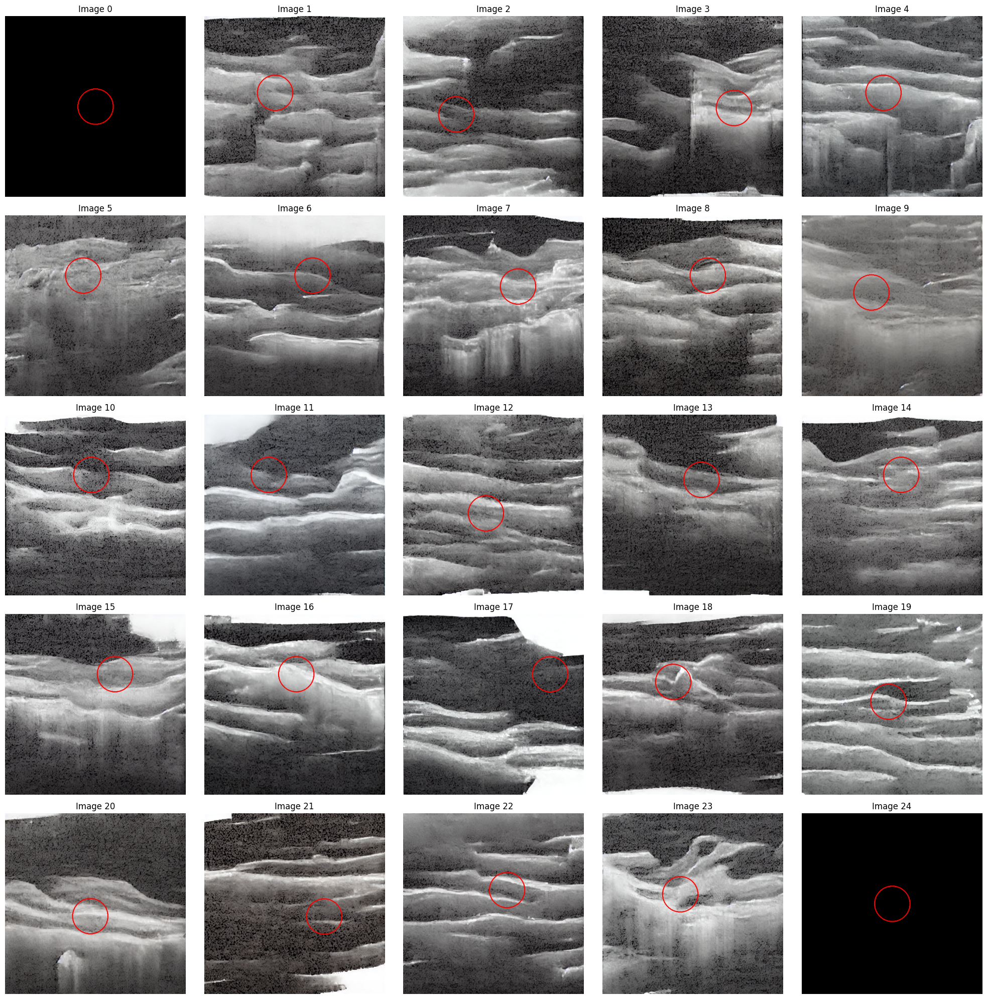

In [24]:
import os
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def find_cnv_region(img, threshold_percentile=90):
    """
    이미지에서 CNV 특성으로 의심되는 고반사 영역의 중심 좌표를 찾습니다.

    Parameters:
    - img (PIL.Image): 입력 이미지
    - threshold_percentile (float): 밝기 임계값 백분위수

    Returns:
    - (center_x, center_y): 고반사 영역의 중심 좌표
    """
    # 그레이스케일로 변환
    img_gray = img.convert("L")
    img_array = np.array(img_gray)

    # 밝기 임계값 계산 (상위 threshold_percentile%)
    threshold = np.percentile(img_array, threshold_percentile)

    # 고반사 영역 마스크
    high_reflectance = img_array > threshold

    # 고반사 영역의 좌표
    y, x = np.where(high_reflectance)

    if len(x) == 0 or len(y) == 0:
        # 고반사 영역이 없으면 이미지 중심 반환
        return img.width // 2, img.height // 2

    # 중심 좌표 계산
    center_x = int(np.mean(x))
    center_y = int(np.mean(y))

    # 망막 중앙 부근(높이의 1/3~2/3)으로 제한
    center_y = max(img.height // 3, min(center_y, img.height * 2 // 3))

    return center_x, center_y

def display_synthetic_images_with_cnv_highlight(
    image_dir="/content/synthetic_cnv/",
    num_images=25,
    rows=5,
    cols=5,
    circle_radius_factor=0.1,
    circle_color="red",
    threshold_percentile=90
):
    """
    Synthetic CNV 이미지를 그리드 형태로 출력하고, CNV 특성 부위를 빨간색 동그라미로 표시합니다.

    Parameters:
    - image_dir (str): 이미지가 저장된 디렉토리 경로
    - num_images (int): 출력할 이미지 수
    - rows (int): 그리드의 행 수
    - cols (int): 그리드의 열 수
    - circle_radius_factor (float): 동그라미 반지름 (이미지 너비 기준 비율)
    - circle_color (str): 동그라미 색상
    - threshold_percentile (float): 고반사 영역 탐지용 밝기 백분위수
    """
    # 이미지 파일 목록 가져오기
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    image_files.sort()

    if not image_files:
        print(f"Error: No images found in {image_dir}")
        return

    # 출력할 이미지 수 제한
    num_images = min(num_images, len(image_files))
    if num_images == 0:
        print("No images to display")
        return

    # 그리드 설정
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.ravel() if num_images > 1 else [axes]

    # 이미지 로드 및 동그라미 추가
    for i in range(num_images):
        img_path = os.path.join(image_dir, image_files[i])
        try:
            # 이미지 로드
            img = Image.open(img_path).convert("RGB")

            # CNV 특성 부위 찾기
            center_x, center_y = find_cnv_region(img, threshold_percentile)

            # 동그라미 그리기
            draw = ImageDraw.Draw(img)
            radius = int(img.width * circle_radius_factor)
            left = center_x - radius
            top = center_y - radius
            right = center_x + radius
            bottom = center_y + radius
            draw.ellipse([left, top, right, bottom], outline=circle_color, width=3)

            # matplotlib으로 출력
            axes[i].imshow(img)
            axes[i].set_title(f"Image {i}")
            axes[i].axis('off')
        except Exception as e:
            print(f"Error loading {img_path}: {e}")
            axes[i].axis('off')

    # 남은 빈 플롯 비활성화
    for i in range(num_images, rows * cols):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Synthetic CNV 이미지 출력 (CNV 특성에 빨간색 동그라미 표시)
display_synthetic_images_with_cnv_highlight(
    image_dir="/content/synthetic_cnv/",
    num_images=25,
    rows=5,
    cols=5,
    circle_radius_factor=0.1,
    circle_color="red",
    threshold_percentile=90
)